<a href="https://colab.research.google.com/github/dandichristiawan/machine-learning/blob/main/Week%234/%2310%20Solar%20Power%20Generation%20with%20Seaborn%20and%20Plotly.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import datetime as datetime
import plotly.graph_objects as go
from plotly.subplots import make_subplots
%matplotlib inline

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [3]:
solar01 = pd.read_csv('/content/drive/MyDrive/machine-learning/Plant_1_Generation_Data.csv')
sensor01 = pd.read_csv('/content/drive/MyDrive/machine-learning/Plant_1_Weather_Sensor_Data.csv')
solar02 = pd.read_csv('/content/drive/MyDrive/machine-learning/Plant_2_Generation_Data.csv')
sensor02 = pd.read_csv('/content/drive/MyDrive/machine-learning/Plant_2_Weather_Sensor_Data.csv')

In [4]:
solar01.head()

,DATE_TIME,PLANT_ID,SOURCE_KEY,DC_POWER,AC_POWER,DAILY_YIELD,TOTAL_YIELD
0,15-05-2020 00:00,4135001,1BY6WEcLGh8j5v7,0.0,0.0,0.0,6259559.0
1,15-05-2020 00:00,4135001,1IF53ai7Xc0U56Y,0.0,0.0,0.0,6183645.0
2,15-05-2020 00:00,4135001,3PZuoBAID5Wc2HD,0.0,0.0,0.0,6987759.0
3,15-05-2020 00:00,4135001,7JYdWkrLSPkdwr4,0.0,0.0,0.0,7602960.0
4,15-05-2020 00:00,4135001,McdE0feGgRqW7Ca,0.0,0.0,0.0,7158964.0


In [5]:
solar02.head()

,DATE_TIME,PLANT_ID,SOURCE_KEY,DC_POWER,AC_POWER,DAILY_YIELD,TOTAL_YIELD
0,2020-05-15 00:00:00,4136001,4UPUqMRk7TRMgml,0.0,0.0,9425.000000,2.429011e+06
1,2020-05-15 00:00:00,4136001,81aHJ1q11NBPMrL,0.0,0.0,0.000000,1.215279e+09
2,2020-05-15 00:00:00,4136001,9kRcWv60rDACzjR,0.0,0.0,3075.333333,2.247720e+09
3,2020-05-15 00:00:00,4136001,Et9kgGMDl729KT4,0.0,0.0,269.933333,1.704250e+06
4,2020-05-15 00:00:00,4136001,IQ2d7wF4YD8zU1Q,0.0,0.0,3177.000000,1.994153e+07


In [6]:
print("Solar Generation Plant 1's info")
solar01.info()
print('\n')
print("Solar Generation Plant 2's info")
solar02.info()

Solar Generation Plant 1's info
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 68778 entries, 0 to 68777
Data columns (total 7 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   DATE_TIME    68778 non-null  object 
 1   PLANT_ID     68778 non-null  int64  
 2   SOURCE_KEY   68778 non-null  object 
 3   DC_POWER     68778 non-null  float64
 4   AC_POWER     68778 non-null  float64
 5   DAILY_YIELD  68778 non-null  float64
 6   TOTAL_YIELD  68778 non-null  float64
dtypes: float64(4), int64(1), object(2)
memory usage: 3.7+ MB


Solar Generation Plant 2's info
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 67698 entries, 0 to 67697
Data columns (total 7 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   DATE_TIME    67698 non-null  object 
 1   PLANT_ID     67698 non-null  int64  
 2   SOURCE_KEY   67698 non-null  object 
 3   DC_POWER     67698 non-null  float64
 4   AC_POWER     67698 no

In [7]:
print('Plant 1')
solar01.isnull().sum()

Plant 1


DATE_TIME      0
PLANT_ID       0
SOURCE_KEY     0
DC_POWER       0
AC_POWER       0
DAILY_YIELD    0
TOTAL_YIELD    0
dtype: int64

In [8]:
print('Plant 2')
solar02.isnull().sum()

Plant 2


DATE_TIME      0
PLANT_ID       0
SOURCE_KEY     0
DC_POWER       0
AC_POWER       0
DAILY_YIELD    0
TOTAL_YIELD    0
dtype: int64

In [9]:
print ('Plant 1 has '+ str(solar01['SOURCE_KEY'].nunique()) + ' inverters')
print ('Plant 2 has '+ str(solar02['SOURCE_KEY'].nunique()) + ' inverters')

Plant 1 has 22 inverters
Plant 2 has 22 inverters


In [10]:
print('Plant 1')
solar01.groupby('SOURCE_KEY').count()

Plant 1


,DATE_TIME,PLANT_ID,DC_POWER,AC_POWER,DAILY_YIELD,TOTAL_YIELD
SOURCE_KEY,,,,,,
1BY6WEcLGh8j5v7,3154,3154,3154,3154,3154,3154
1IF53ai7Xc0U56Y,3119,3119,3119,3119,3119,3119
3PZuoBAID5Wc2HD,3118,3118,3118,3118,3118,3118
7JYdWkrLSPkdwr4,3133,3133,3133,3133,3133,3133
McdE0feGgRqW7Ca,3124,3124,3124,3124,3124,3124
VHMLBKoKgIrUVDU,3133,3133,3133,3133,3133,3133
WRmjgnKYAwPKWDb,3118,3118,3118,3118,3118,3118
YxYtjZvoooNbGkE,3104,3104,3104,3104,3104,3104
ZnxXDlPa8U1GXgE,3130,3130,3130,3130,3130,3130


In [11]:
print('Plant 2')
solar02.groupby('SOURCE_KEY').count()

Plant 2


,DATE_TIME,PLANT_ID,DC_POWER,AC_POWER,DAILY_YIELD,TOTAL_YIELD
SOURCE_KEY,,,,,,
4UPUqMRk7TRMgml,3195,3195,3195,3195,3195,3195
81aHJ1q11NBPMrL,3259,3259,3259,3259,3259,3259
9kRcWv60rDACzjR,3259,3259,3259,3259,3259,3259
Et9kgGMDl729KT4,3195,3195,3195,3195,3195,3195
IQ2d7wF4YD8zU1Q,2355,2355,2355,2355,2355,2355
LYwnQax7tkwH5Cb,3259,3259,3259,3259,3259,3259
LlT2YUhhzqhg5Sw,3259,3259,3259,3259,3259,3259
Mx2yZCDsyf6DPfv,3195,3195,3195,3195,3195,3195
NgDl19wMapZy17u,2355,2355,2355,2355,2355,2355


In [12]:
sensor01.head()

,DATE_TIME,PLANT_ID,SOURCE_KEY,AMBIENT_TEMPERATURE,MODULE_TEMPERATURE,IRRADIATION
0,2020-05-15 00:00:00,4135001,HmiyD2TTLFNqkNe,25.184316,22.857507,0.0
1,2020-05-15 00:15:00,4135001,HmiyD2TTLFNqkNe,25.084589,22.761668,0.0
2,2020-05-15 00:30:00,4135001,HmiyD2TTLFNqkNe,24.935753,22.592306,0.0
3,2020-05-15 00:45:00,4135001,HmiyD2TTLFNqkNe,24.846130,22.360852,0.0
4,2020-05-15 01:00:00,4135001,HmiyD2TTLFNqkNe,24.621525,22.165423,0.0


In [13]:
sensor02.head()

,DATE_TIME,PLANT_ID,SOURCE_KEY,AMBIENT_TEMPERATURE,MODULE_TEMPERATURE,IRRADIATION
0,2020-05-15 00:00:00,4136001,iq8k7ZNt4Mwm3w0,27.004764,25.060789,0.0
1,2020-05-15 00:15:00,4136001,iq8k7ZNt4Mwm3w0,26.880811,24.421869,0.0
2,2020-05-15 00:30:00,4136001,iq8k7ZNt4Mwm3w0,26.682055,24.427290,0.0
3,2020-05-15 00:45:00,4136001,iq8k7ZNt4Mwm3w0,26.500589,24.420678,0.0
4,2020-05-15 01:00:00,4136001,iq8k7ZNt4Mwm3w0,26.596148,25.088210,0.0


In [14]:
print("Sensor 1's info")
sensor01.info()
print('\n')
print("Sensor 2's info")
sensor02.info()

Sensor 1's info
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3182 entries, 0 to 3181
Data columns (total 6 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   DATE_TIME            3182 non-null   object 
 1   PLANT_ID             3182 non-null   int64  
 2   SOURCE_KEY           3182 non-null   object 
 3   AMBIENT_TEMPERATURE  3182 non-null   float64
 4   MODULE_TEMPERATURE   3182 non-null   float64
 5   IRRADIATION          3182 non-null   float64
dtypes: float64(3), int64(1), object(2)
memory usage: 149.3+ KB


Sensor 2's info
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3259 entries, 0 to 3258
Data columns (total 6 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   DATE_TIME            3259 non-null   object 
 1   PLANT_ID             3259 non-null   int64  
 2   SOURCE_KEY           3259 non-null   object 
 3   AMBIENT_TEMPERATURE  3259 non-null 

In [15]:
print('Sensor 1 has '+str(sensor01['SOURCE_KEY'].nunique())+' source key')
print('Sensor 2 has '+str(sensor02['SOURCE_KEY'].nunique())+' source key')

Sensor 1 has 1 source key
Sensor 2 has 1 source key


In [16]:
print('Sensor 1')
sensor01.isnull().sum()

Sensor 1


DATE_TIME              0
PLANT_ID               0
SOURCE_KEY             0
AMBIENT_TEMPERATURE    0
MODULE_TEMPERATURE     0
IRRADIATION            0
dtype: int64

In [17]:
print('Sensor 2')
sensor01.isnull().sum()

Sensor 2


DATE_TIME              0
PLANT_ID               0
SOURCE_KEY             0
AMBIENT_TEMPERATURE    0
MODULE_TEMPERATURE     0
IRRADIATION            0
dtype: int64

In [18]:
print('Sensor 1')
sensor01.count()

Sensor 1


DATE_TIME              3182
PLANT_ID               3182
SOURCE_KEY             3182
AMBIENT_TEMPERATURE    3182
MODULE_TEMPERATURE     3182
IRRADIATION            3182
dtype: int64

In [19]:
print('Sensor 2')
sensor02.count()

Sensor 2


DATE_TIME              3259
PLANT_ID               3259
SOURCE_KEY             3259
AMBIENT_TEMPERATURE    3259
MODULE_TEMPERATURE     3259
IRRADIATION            3259
dtype: int64

In [20]:
print('the total should be '+ str(34*24*4)+' rows')

the total should be 3264 rows


## Data Cleaning

In [21]:
solar01.columns = solar01.columns.str.lower()
solar02.columns = solar02.columns.str.lower()
solar01.drop('plant_id', axis=1, inplace=True)
solar02.drop('plant_id', axis=1, inplace=True)

In [22]:
solar01['date_time'] = pd.to_datetime(solar01['date_time'],format ='%d-%m-%Y %H:%M')
solar02['date_time'] = pd.to_datetime(solar02['date_time'],format ='%Y-%m-%d %H:%M:%S')
solar01['date'] = solar01['date_time'].dt.date
solar01['time'] = solar01['date_time'].dt.time
solar02['date'] = solar02['date_time'].dt.date
solar02['time'] = solar02['date_time'].dt.time

In [23]:
solar01_inverter_id = solar01['source_key'].unique()
solar02_inverter_id = solar02['source_key'].unique()
solar01['source_key'] = solar01['source_key'].apply(lambda x :  int(np.where(solar01_inverter_id == x)[0]))
solar02['source_key'] = solar02['source_key'].apply(lambda x :  int(np.where(solar02_inverter_id == x)[0]))

In [24]:
solar01.head()

,date_time,source_key,dc_power,ac_power,daily_yield,total_yield,date,time
0,2020-05-15,0,0.0,0.0,0.0,6259559.0,2020-05-15,00:00:00
1,2020-05-15,1,0.0,0.0,0.0,6183645.0,2020-05-15,00:00:00
2,2020-05-15,2,0.0,0.0,0.0,6987759.0,2020-05-15,00:00:00
3,2020-05-15,3,0.0,0.0,0.0,7602960.0,2020-05-15,00:00:00
4,2020-05-15,4,0.0,0.0,0.0,7158964.0,2020-05-15,00:00:00


In [25]:
solar02.head()

,date_time,source_key,dc_power,ac_power,daily_yield,total_yield,date,time
0,2020-05-15,0,0.0,0.0,9425.000000,2.429011e+06,2020-05-15,00:00:00
1,2020-05-15,1,0.0,0.0,0.000000,1.215279e+09,2020-05-15,00:00:00
2,2020-05-15,2,0.0,0.0,3075.333333,2.247720e+09,2020-05-15,00:00:00
3,2020-05-15,3,0.0,0.0,269.933333,1.704250e+06,2020-05-15,00:00:00
4,2020-05-15,4,0.0,0.0,3177.000000,1.994153e+07,2020-05-15,00:00:00


In [26]:
solar01[(solar01['source_key']==0) & (solar01['date_time'].between('2020-05-15','2020-05-21'))]

,date_time,source_key,dc_power,ac_power,daily_yield,total_yield,date,time
0,2020-05-15 00:00:00,0,0.0,0.0,0.0,6259559.0,2020-05-15,00:00:00
21,2020-05-15 00:15:00,0,0.0,0.0,0.0,6259559.0,2020-05-15,00:15:00
42,2020-05-15 00:30:00,0,0.0,0.0,0.0,6259559.0,2020-05-15,00:30:00
63,2020-05-15 00:45:00,0,0.0,0.0,0.0,6259559.0,2020-05-15,00:45:00
84,2020-05-15 01:00:00,0,0.0,0.0,0.0,6259559.0,2020-05-15,01:00:00
...,...,...,...,...,...,...,...,...
11664,2020-05-20 21:45:00,0,0.0,0.0,8249.0,6298346.0,2020-05-20,21:45:00
11686,2020-05-20 22:00:00,0,0.0,0.0,8249.0,6298346.0,2020-05-20,22:00:00
11708,2020-05-20 22:15:00,0,0.0,0.0,8249.0,6298346.0,2020-05-20,22:15:00
11730,2020-05-20 22:30:00,0,0.0,0.0,8249.0,6298346.0,2020-05-20,22:30:00


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



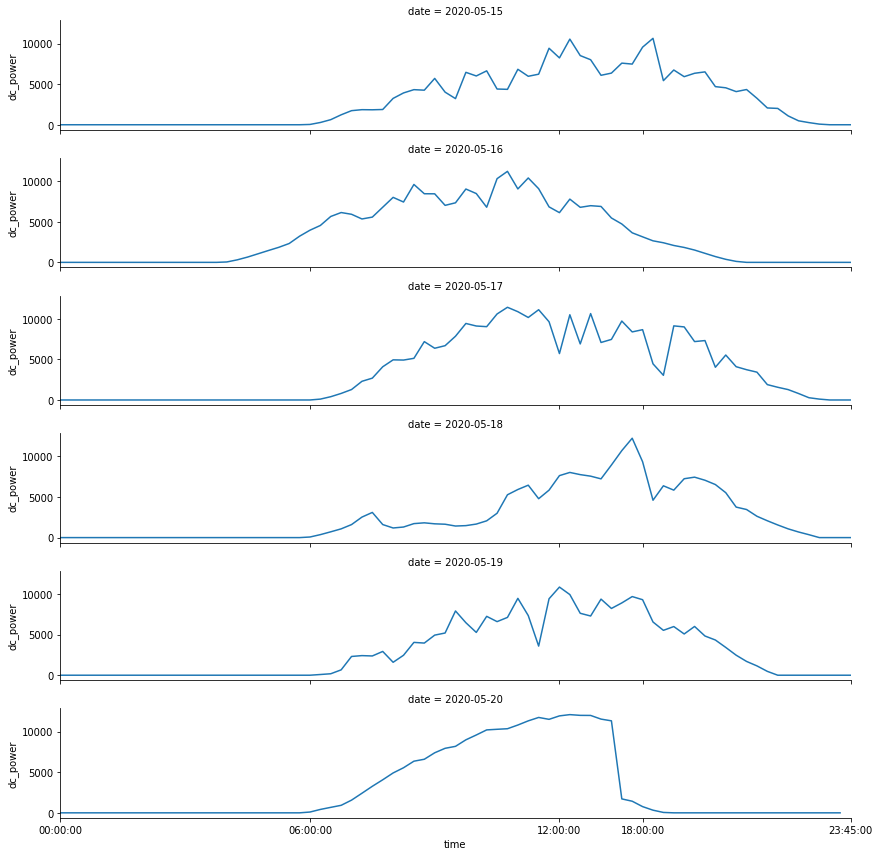

In [27]:
data = solar01[(solar01['source_key']==0) & (solar01['date_time'].between('2020-05-15','2020-05-21'))]
data['time'] = data['time'].astype(str)
g = sns.relplot(
        data=data,
        x='time',
        y='dc_power',
        row='date',
        kind='line',
        height=2,
        aspect=6)

g.set(xlim=('00:00:00', '23:45:00'), xticks=['00:00:00','06:00:00','12:00:00','18:00:00','23:45:00'])

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



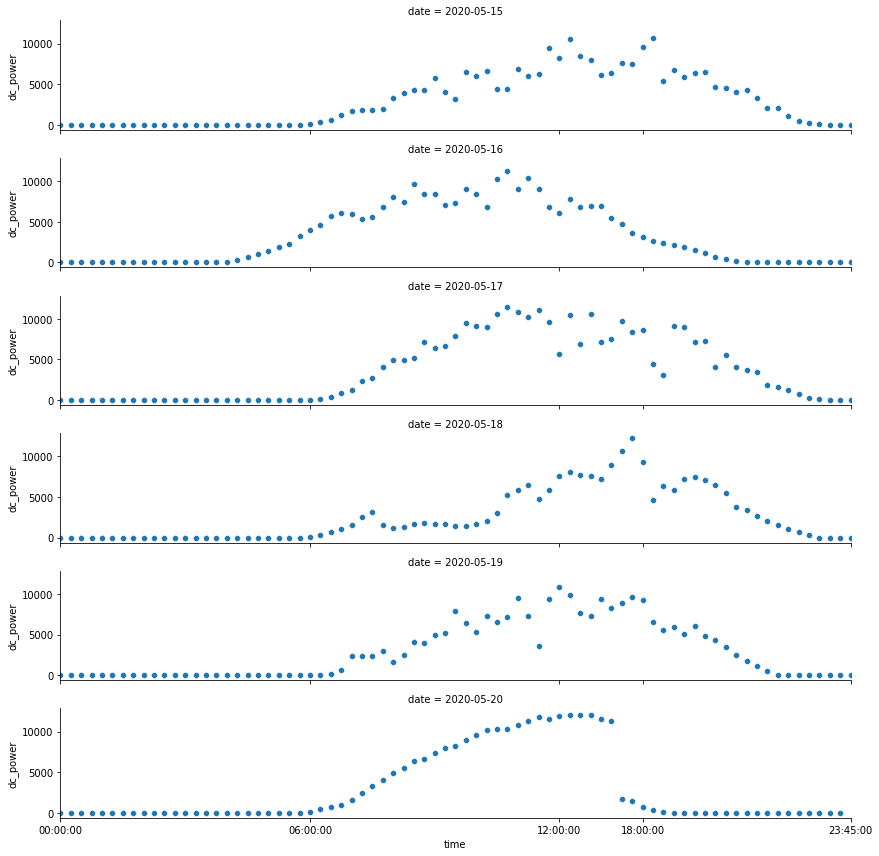

In [28]:
data = solar01[(solar01['source_key']==0) & (solar01['date_time'].between('2020-05-15','2020-05-21'))]
data['time'] = data['time'].astype(str)
g = sns.relplot(
        data=data,
        x='time',
        y='dc_power',
        row='date',
        kind='scatter',
        height=2,
        aspect=6
        )
    
g.set(xlim=('00:00:00', '23:45:00'), xticks=['00:00:00','06:00:00','12:00:00','18:00:00','23:45:00'])

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



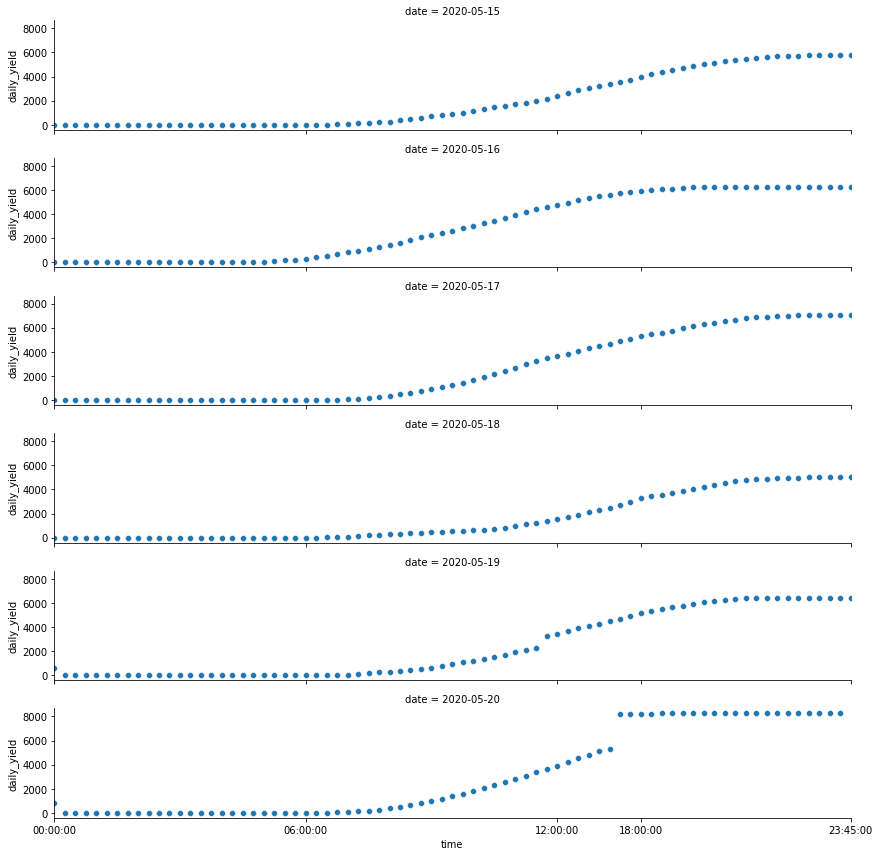

In [29]:
data = solar01[(solar01['source_key']==0) & (solar01['date_time'].between('2020-05-15','2020-05-21'))]
data['time'] = data['time'].astype(str)
g = sns.relplot(
        data=data,
        x='time',
        y='daily_yield',
        row='date',
        kind='scatter',
        height=2,
        aspect=6
        )

g.set(xlim=('00:00:00', '23:45:00'), xticks=['00:00:00','06:00:00','12:00:00','18:00:00','23:45:00'])

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



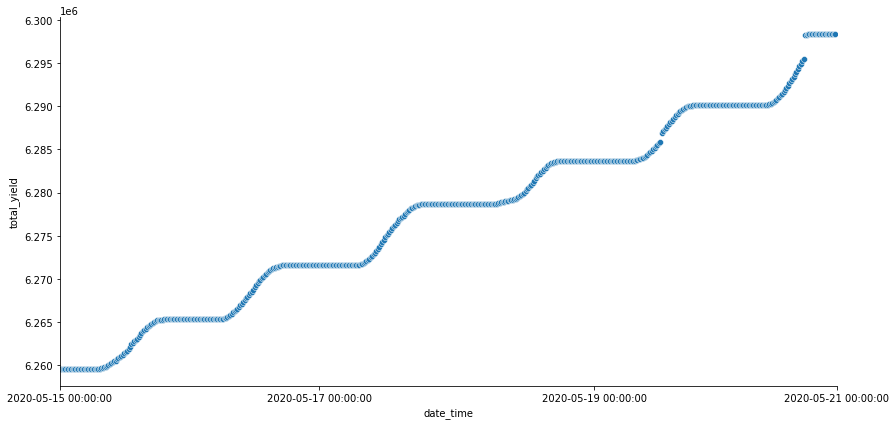

In [30]:
data = solar01[(solar01['source_key']==0) & (solar01['date_time'].between('2020-05-15','2020-05-21'))]
data['date_time'] = data['date_time'].astype(str)
g = sns.relplot(
        data=data,
        x='date_time',
        y='total_yield',
        kind='scatter',
        height=6,
        aspect=2
        )

g.set(xlim=('2020-05-15 00:00:00', '2020-05-21 00:00:00'), xticks=['2020-05-15 00:00:00','2020-05-17 00:00:00','2020-05-19 00:00:00','2020-05-21 00:00:00'])

In [31]:
fulltime = pd.date_range(start='2020-05-15 00:00',end='2020-06-17 23:45' , freq='15T')
fulltime = pd.DataFrame({'date_time':fulltime})
fulltime

,date_time
0,2020-05-15 00:00:00
1,2020-05-15 00:15:00
2,2020-05-15 00:30:00
3,2020-05-15 00:45:00
4,2020-05-15 01:00:00
...,...
3259,2020-06-17 22:45:00
3260,2020-06-17 23:00:00
3261,2020-06-17 23:15:00
3262,2020-06-17 23:30:00


In [32]:
solar01_inv_0 = solar01[solar01['source_key']==0].reset_index(drop=True)

In [33]:
solar01_inv_0 = pd.merge(fulltime, solar01_inv_0, how='outer')
solar01_inv_0

,date_time,source_key,dc_power,ac_power,daily_yield,total_yield,date,time
0,2020-05-15 00:00:00,0.0,0.0,0.0,0.0,6259559.0,2020-05-15,00:00:00
1,2020-05-15 00:15:00,0.0,0.0,0.0,0.0,6259559.0,2020-05-15,00:15:00
2,2020-05-15 00:30:00,0.0,0.0,0.0,0.0,6259559.0,2020-05-15,00:30:00
3,2020-05-15 00:45:00,0.0,0.0,0.0,0.0,6259559.0,2020-05-15,00:45:00
4,2020-05-15 01:00:00,0.0,0.0,0.0,0.0,6259559.0,2020-05-15,01:00:00
...,...,...,...,...,...,...,...,...
3259,2020-06-17 22:45:00,0.0,0.0,0.0,5521.0,6485319.0,2020-06-17,22:45:00
3260,2020-06-17 23:00:00,0.0,0.0,0.0,5521.0,6485319.0,2020-06-17,23:00:00
3261,2020-06-17 23:15:00,0.0,0.0,0.0,5521.0,6485319.0,2020-06-17,23:15:00
3262,2020-06-17 23:30:00,0.0,0.0,0.0,5521.0,6485319.0,2020-06-17,23:30:00


In [34]:
solar01_inv_0.index = solar01_inv_0['date_time']
solar01_inv_0.drop('date_time', axis=1, inplace=True)

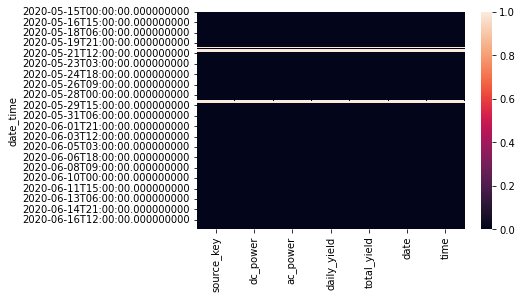

In [35]:
sns.heatmap(solar01_inv_0.isnull())

In [36]:
solar01_inv_0['date'] = solar01_inv_0.index.date
solar01_inv_0['time'] = solar01_inv_0.index.time
solar01_inv_0['source_key'] = 0

In [37]:
solar01_inv_0.isnull().sum()

source_key       0
dc_power       110
ac_power       110
daily_yield    110
total_yield    110
date             0
time             0
dtype: int64

In [38]:
early_morning = solar01_inv_0.between_time('00:00:00','05:45:00')
afternoon     = solar01_inv_0.between_time('06:00:00','18:30:00')
night         = solar01_inv_0.between_time('18:45:00','23:45:00')

In [39]:
early_morning['dc_power'].fillna(value=0, inplace=True)
early_morning['ac_power'].fillna(value=0, inplace=True)
early_morning['daily_yield'].fillna(value =0, inplace=True)

/usr/local/lib/python3.7/dist-packages/pandas/core/series.py:4536: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [40]:
night['dc_power'].fillna(value=0, inplace=True)
night['ac_power'].fillna(value=0, inplace=True)
night['daily_yield'].fillna(method='ffill', inplace=True)

/usr/local/lib/python3.7/dist-packages/pandas/core/series.py:4536: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [41]:
solar01_inv_0 = pd.concat([early_morning,afternoon, night])
solar01_inv_0 = solar01_inv_0.sort_index()

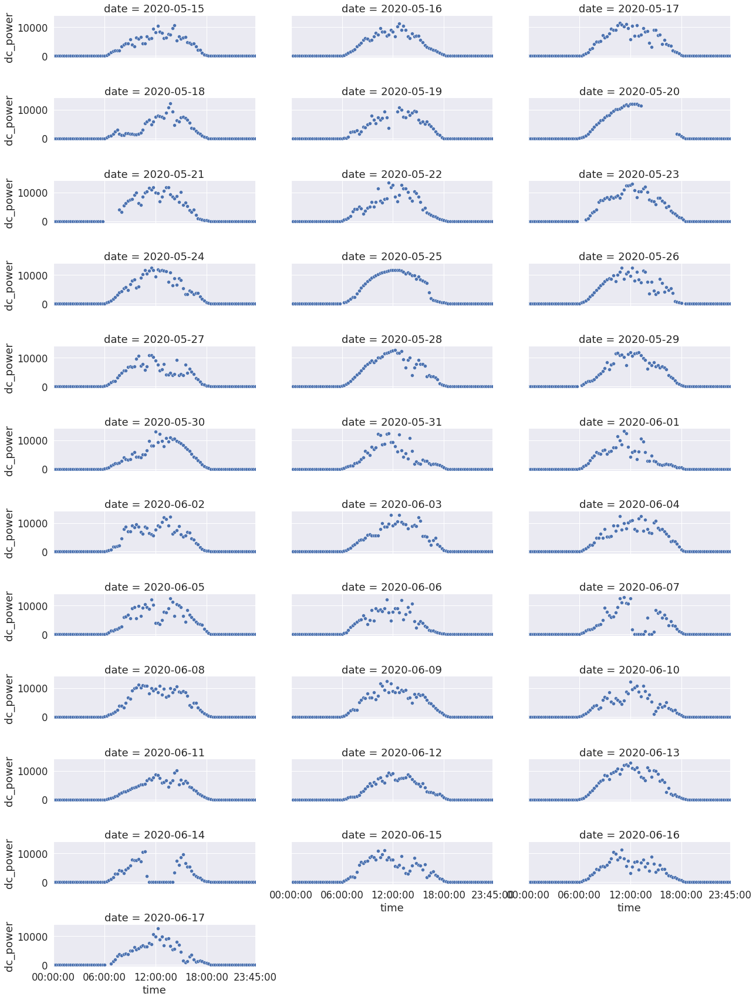

In [42]:
data = solar01_inv_0
data['time'] = data['time'].astype(str)
sns.set(font_scale =1.5)

g = sns.relplot(
        data=data,
        x='time',
        y='dc_power',
        col='date',
        kind='scatter',
        height=2,
        aspect=3,
        col_wrap=3
        )

g.set(xlim=('00:00:00', '23:45:00'), xticks=['00:00:00','06:00:00','12:00:00','18:00:00','23:45:00'])

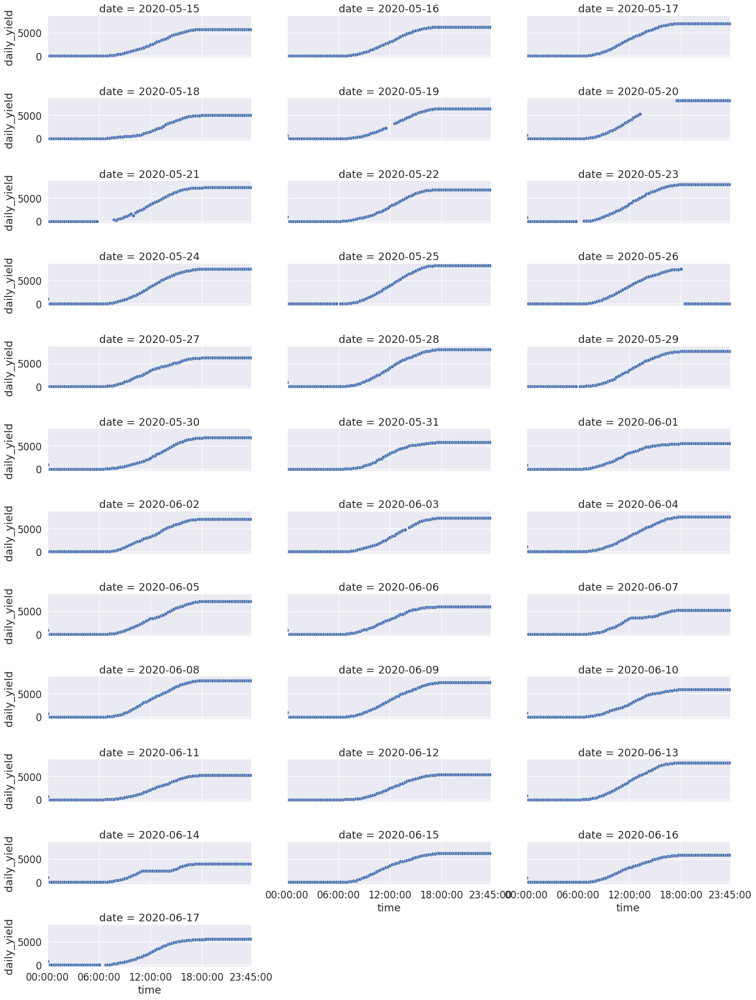

In [43]:
data = solar01_inv_0
data['time'] = data['time'].astype(str)
sns.set(font_scale =1.5)

g = sns.relplot(
        data=data,
        x='time',
        y='daily_yield',
        col='date',
        kind='scatter',
        height=2,
        aspect=3,
        col_wrap=3
        )

g.set(xlim=('00:00:00', '23:45:00'), xticks=['00:00:00','06:00:00','12:00:00','18:00:00','23:45:00'])

In [44]:
solar01_inv_0.isnull().sum()

source_key       0
dc_power        35
ac_power        35
daily_yield     35
total_yield    110
date             0
time             0
dtype: int64

In [45]:
solar01_inv_0[['ac_power','dc_power','daily_yield']] = solar01_inv_0[['ac_power','dc_power','daily_yield']].interpolate(method='time')

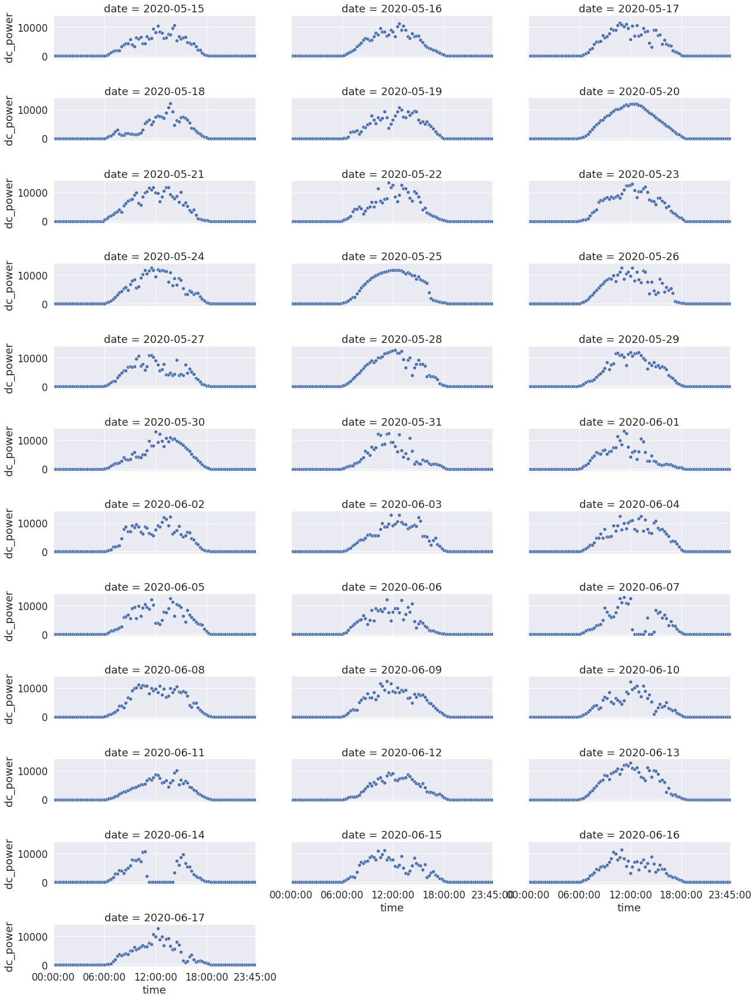

In [46]:
data = solar01_inv_0
data['time'] = data['time'].astype(str)
sns.set(font_scale =1.5)

g = sns.relplot(
        data=data,
        x='time',
        y='dc_power',
        col='date',
        kind='scatter',
        height=2,
        aspect=3,
        col_wrap=3
        )

g.set(xlim=('00:00:00', '23:45:00'), xticks=['00:00:00','06:00:00','12:00:00','18:00:00','23:45:00'])

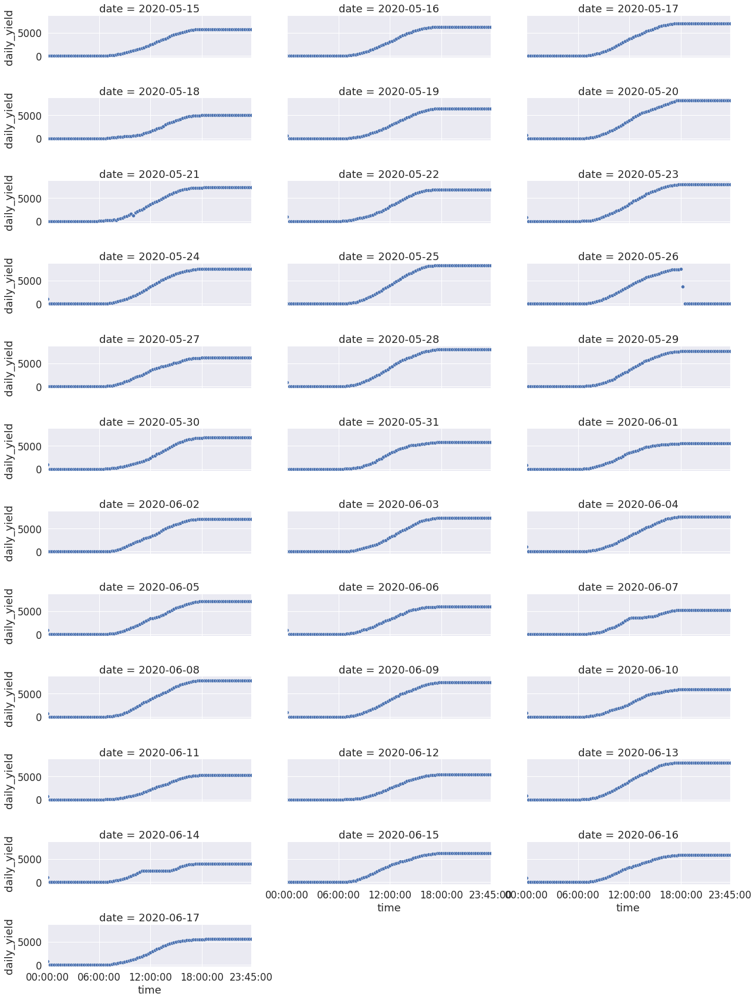

In [47]:
data = solar01_inv_0
data['time'] = data['time'].astype(str)
sns.set(font_scale =1.5)

g = sns.relplot(
        data=data,
        x='time',
        y='daily_yield',
        col='date',
        kind='scatter',
        height=2,
        aspect=3,
        col_wrap=3
        )

g.set(xlim=('00:00:00', '23:45:00'), xticks=['00:00:00','06:00:00','12:00:00','18:00:00','23:45:00'])

In [48]:
solar01_inv_0.isnull().sum()

source_key       0
dc_power         0
ac_power         0
daily_yield      0
total_yield    110
date             0
time             0
dtype: int64

In [49]:
solar01_inv_0['total_yield'] = solar01_inv_0['total_yield'].interpolate(method='time')

[[<matplotlib.axis.XTick at 0x7f985b555150>,
 (0.0, 3168.0)]

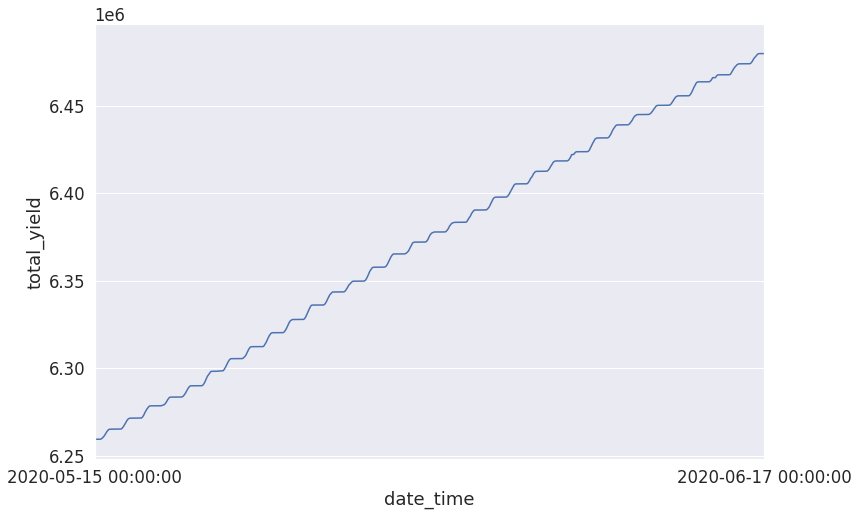

In [50]:
data = solar01_inv_0
data.index = data.index.astype(str)

f, ax =plt.subplots(figsize=(12,8))
ax = sns.lineplot(x=data.index, 
                  y='total_yield',
                  data = data
                 )

ax.set(xlim=('2020-05-15 00:00:00','2020-06-17 00:00:00'),xticks=['2020-05-15 00:00:00','2020-06-17 00:00:00'])

In [51]:
solar01_inv_0.isnull().sum()

source_key     0
dc_power       0
ac_power       0
daily_yield    0
total_yield    0
date           0
time           0
dtype: int64

In [52]:
solar01_inv = [0]*22

def data_filling(inverter_id):
    #create dataframe based on inverter id.
    solar01_inv[inverter_id] = solar01[solar01['source_key']==inverter_id].reset_index(drop=True)
    
    #add full timestamp to dataframe.
    solar01_inv[inverter_id] = pd.merge(fulltime, solar01_inv[inverter_id], how='outer')
    
    #fill na with fix values.
    solar01_inv[inverter_id]['date'] = solar01_inv[inverter_id]['date_time'].dt.date
    solar01_inv[inverter_id]['time'] = solar01_inv[inverter_id]['date_time'].dt.time
    solar01_inv[inverter_id]['source_key'] = inverter_id
    
    #convert column date time as index.
    solar01_inv[inverter_id].index = solar01_inv[inverter_id]['date_time']
    solar01_inv[inverter_id].drop('date_time', axis=1, inplace=True)
    
    #divide dateframe into 3 group.
    early_morning = solar01_inv[inverter_id].between_time('00:00:00','05:45:00')
    afternoon     = solar01_inv[inverter_id].between_time('06:00:00','18:30:00')
    night         = solar01_inv[inverter_id].between_time('18:45:00','23:45:00')
    
    #fill na values on early_morning group with zero.
    early_morning['dc_power'].fillna(value=0, inplace=True)
    early_morning['ac_power'].fillna(value=0, inplace=True)
    early_morning['daily_yield'].fillna(value =0, inplace=True)
    
    #fill na values on night group with zero and fflill method for daily_yield.
    night['dc_power'].fillna(value=0, inplace=True)
    night['ac_power'].fillna(value=0, inplace=True)
    night['daily_yield'].fillna(method='ffill', inplace=True)
    
    #join them together again and sort index, so we get sorted timeline.
    solar01_inv[inverter_id] = pd.concat([early_morning,afternoon, night])
    solar01_inv[inverter_id] = solar01_inv[inverter_id].sort_index()
    
    #fill others na with interpolate function that use method time
    solar01_inv[inverter_id]['dc_power'] = solar01_inv[inverter_id]['dc_power'].interpolate(method='time')
    solar01_inv[inverter_id]['ac_power'] = solar01_inv[inverter_id]['ac_power'].interpolate(method='time')
    solar01_inv[inverter_id]['daily_yield'] = solar01_inv[inverter_id]['daily_yield'].interpolate(method='time')
    solar01_inv[inverter_id]['total_yield'] = solar01_inv[inverter_id]['total_yield'].interpolate(method='time')
    
for i in range (22):
    data_filling(i)

/usr/local/lib/python3.7/dist-packages/pandas/core/series.py:4536: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/usr/local/lib/python3.7/dist-packages/pandas/core/series.py:4536: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/usr/local/lib/python3.7/dist-packages/pandas/core/series.py:4536: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/usr/local/lib/python3.7/dist-packages/pandas/core/series.py:4536: SettingWithCopyWarning:


A value

In [53]:
solar01 = pd.concat(solar01_inv)

In [54]:
solar02_inv = [0]*22


def data_filling(inverter_id):
    #create dataframe based on inverter id.
    solar02_inv[inverter_id] = solar02[solar02['source_key']==inverter_id].reset_index(drop=True)
    
    #add full timestamp to dataframe.
    solar02_inv[inverter_id] = pd.merge(fulltime, solar02_inv[inverter_id], how='outer')
    
    #fill na with fix values.
    solar02_inv[inverter_id]['date'] = solar02_inv[inverter_id]['date_time'].dt.date
    solar02_inv[inverter_id]['time'] = solar02_inv[inverter_id]['date_time'].dt.time
    solar02_inv[inverter_id]['source_key'] = inverter_id
    
    #convert column date time as index.
    solar02_inv[inverter_id].index = solar02_inv[inverter_id]['date_time']
    solar02_inv[inverter_id].drop('date_time', axis=1, inplace=True)
    
    #divide dateframe into 3 group.
    early_morning = solar02_inv[inverter_id].between_time('00:00:00','05:45:00')
    afternoon     = solar02_inv[inverter_id].between_time('06:00:00','18:30:00')
    night         = solar02_inv[inverter_id].between_time('18:45:00','23:45:00')
    
    #fill na values on early_morning group with zero.
    early_morning['dc_power'].fillna(value=0, inplace=True)
    early_morning['ac_power'].fillna(value=0, inplace=True)
    early_morning['daily_yield'].fillna(value =0, inplace=True)
    
    #fill na values on night group with zero and fflill method for daily_yield.
    night['dc_power'].fillna(value=0, inplace=True)
    night['ac_power'].fillna(value=0, inplace=True)
    night['daily_yield'].fillna(method='ffill', inplace=True)
    
    #join them together again and sort index, so we get sorted timeline.
    solar02_inv[inverter_id] = pd.concat([early_morning,afternoon, night])
    solar02_inv[inverter_id] = solar02_inv[inverter_id].sort_index()
    
    #fill others na with interpolate function that use method time
    solar02_inv[inverter_id]['dc_power'] = solar02_inv[inverter_id]['dc_power'].interpolate(method='time')
    solar02_inv[inverter_id]['ac_power'] = solar02_inv[inverter_id]['ac_power'].interpolate(method='time')
    solar02_inv[inverter_id]['daily_yield'] = solar02_inv[inverter_id]['daily_yield'].interpolate(method='time')
    solar02_inv[inverter_id]['total_yield'] = solar02_inv[inverter_id]['total_yield'].interpolate(method='time')
    
for i in range (22):
    data_filling(i)

/usr/local/lib/python3.7/dist-packages/pandas/core/series.py:4536: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/usr/local/lib/python3.7/dist-packages/pandas/core/series.py:4536: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/usr/local/lib/python3.7/dist-packages/pandas/core/series.py:4536: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/usr/local/lib/python3.7/dist-packages/pandas/core/series.py:4536: SettingWithCopyWarning:


A value

In [55]:
solar02 = pd.concat(solar02_inv)

In [56]:
sensor01.columns = sensor01.columns.str.lower()
sensor02.columns = sensor02.columns.str.lower()
sensor01.drop('plant_id', axis=1, inplace=True)
sensor02.drop('plant_id', axis=1, inplace=True)

In [57]:
sensor01['date_time'] = pd.to_datetime(sensor01['date_time'],format ='%Y-%m-%d %H:%M:%S')
sensor02['date_time'] = pd.to_datetime(sensor02['date_time'],format ='%Y-%m-%d %H:%M:%S')
sensor01['date'] = sensor01['date_time'].dt.date
sensor01['time'] = sensor01['date_time'].dt.time
sensor02['date'] = sensor02['date_time'].dt.date
sensor02['time'] = sensor02['date_time'].dt.time

In [58]:
sensor01.head()

,date_time,source_key,ambient_temperature,module_temperature,irradiation,date,time
0,2020-05-15 00:00:00,HmiyD2TTLFNqkNe,25.184316,22.857507,0.0,2020-05-15,00:00:00
1,2020-05-15 00:15:00,HmiyD2TTLFNqkNe,25.084589,22.761668,0.0,2020-05-15,00:15:00
2,2020-05-15 00:30:00,HmiyD2TTLFNqkNe,24.935753,22.592306,0.0,2020-05-15,00:30:00
3,2020-05-15 00:45:00,HmiyD2TTLFNqkNe,24.846130,22.360852,0.0,2020-05-15,00:45:00
4,2020-05-15 01:00:00,HmiyD2TTLFNqkNe,24.621525,22.165423,0.0,2020-05-15,01:00:00


In [59]:
sensor02.head()

,date_time,source_key,ambient_temperature,module_temperature,irradiation,date,time
0,2020-05-15 00:00:00,iq8k7ZNt4Mwm3w0,27.004764,25.060789,0.0,2020-05-15,00:00:00
1,2020-05-15 00:15:00,iq8k7ZNt4Mwm3w0,26.880811,24.421869,0.0,2020-05-15,00:15:00
2,2020-05-15 00:30:00,iq8k7ZNt4Mwm3w0,26.682055,24.427290,0.0,2020-05-15,00:30:00
3,2020-05-15 00:45:00,iq8k7ZNt4Mwm3w0,26.500589,24.420678,0.0,2020-05-15,00:45:00
4,2020-05-15 01:00:00,iq8k7ZNt4Mwm3w0,26.596148,25.088210,0.0,2020-05-15,01:00:00


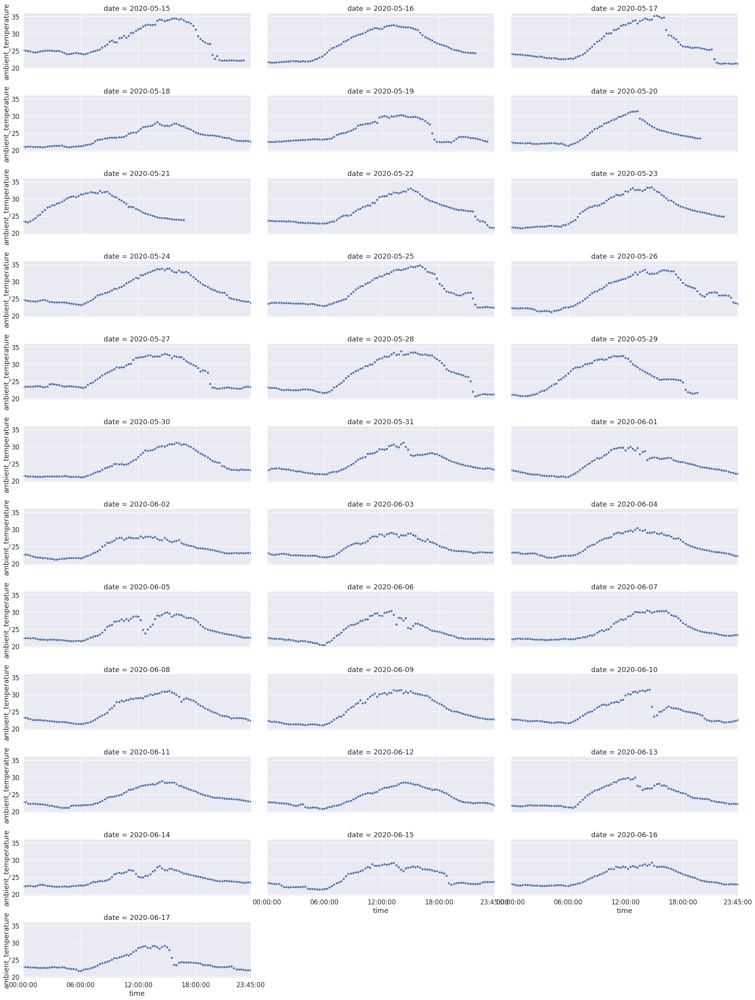

In [60]:
data = sensor01
data['time'] = data['time'].astype(str)
sns.set(font_scale =1.5)
g = sns.relplot(data=data,
            x='time',
            y='ambient_temperature',
            col='date',
            kind='scatter',
            height=3,
            aspect=3,
            col_wrap=3
               )
g.set(xlim=('00:00:00', '23:45:00'), xticks=['00:00:00','06:00:00','12:00:00','18:00:00','23:45:00'])

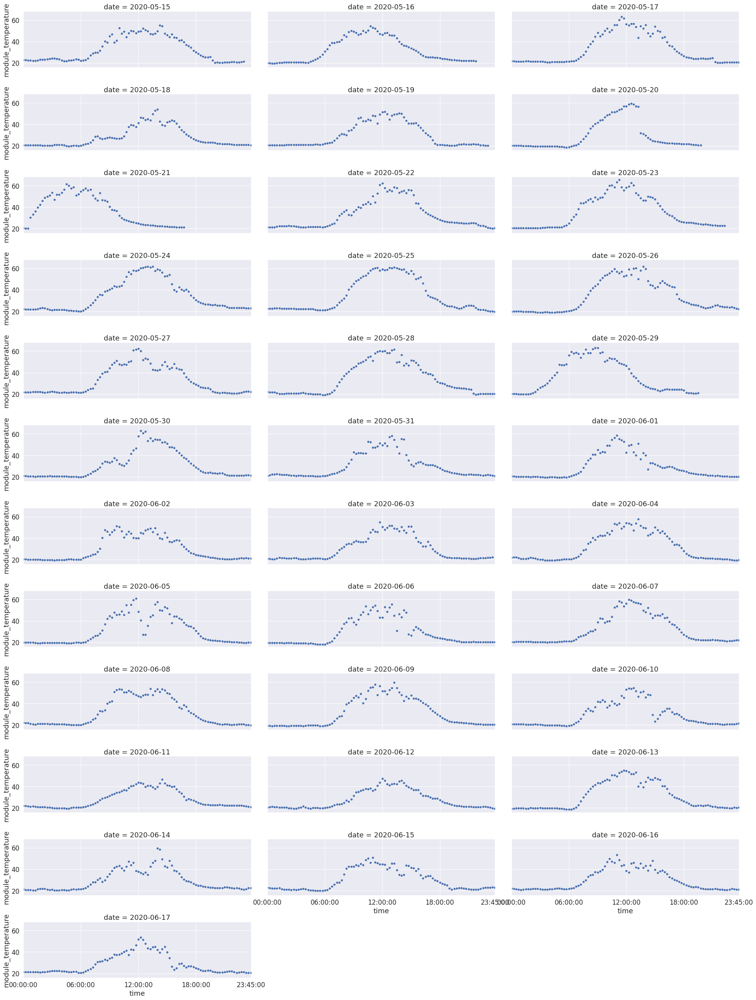

In [61]:
data = sensor01
data['time'] = data['time'].astype(str)
sns.set(font_scale =1.5)
g = sns.relplot(data=data,
            x='time',
            y='module_temperature',
            col='date',
            kind='scatter',
            height=3,
            aspect=3,
            col_wrap=3)
g.set(xlim=('00:00:00', '23:45:00'), xticks=['00:00:00','06:00:00','12:00:00','18:00:00','23:45:00'])

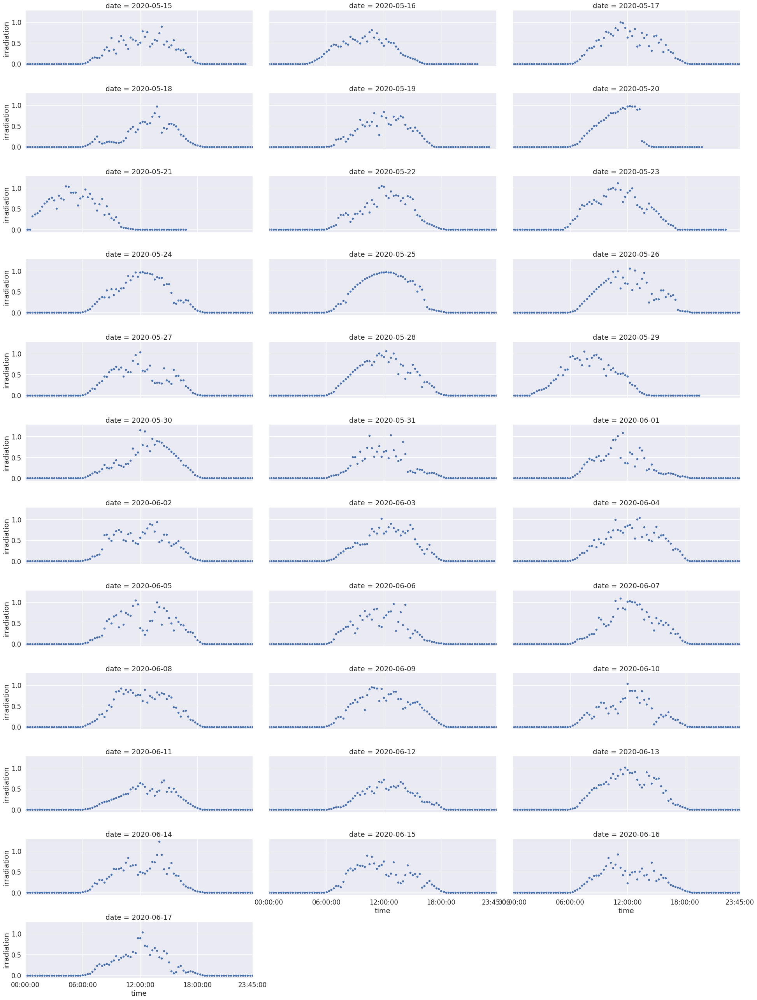

In [62]:
data = sensor01
data['time'] = data['time'].astype(str)
sns.set(font_scale =1.5)
g = sns.relplot(data=data,
            x='time',
            y='irradiation',
            col='date',
            kind='scatter',
            height=3,
            aspect=3,
            col_wrap=3)
g.set(xlim=('00:00:00', '23:45:00'), xticks=['00:00:00','06:00:00','12:00:00','18:00:00','23:45:00'])

In [63]:
sensor01 = pd.merge(fulltime, sensor01, how='outer')
sensor02 = pd.merge(fulltime, sensor02, how='outer')
sensor01.index = sensor01['date_time']
sensor02.index = sensor02['date_time']

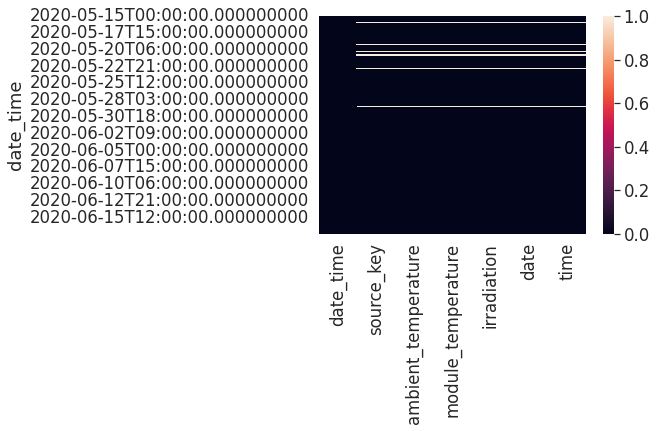

In [64]:
sns.heatmap(sensor01.isnull())

In [65]:
sensor01['date'] = sensor01.index.date
sensor01['time'] = sensor01.index.time
sensor02['date'] = sensor02.index.date
sensor02['time'] = sensor02.index.time

In [66]:
sensor01[['ambient_temperature','module_temperature', 'irradiation']] = sensor01[['ambient_temperature','module_temperature', 'irradiation']].interpolate(method='time')
sensor02[['ambient_temperature','module_temperature', 'irradiation']] = sensor02[['ambient_temperature','module_temperature', 'irradiation']].interpolate(method='time')

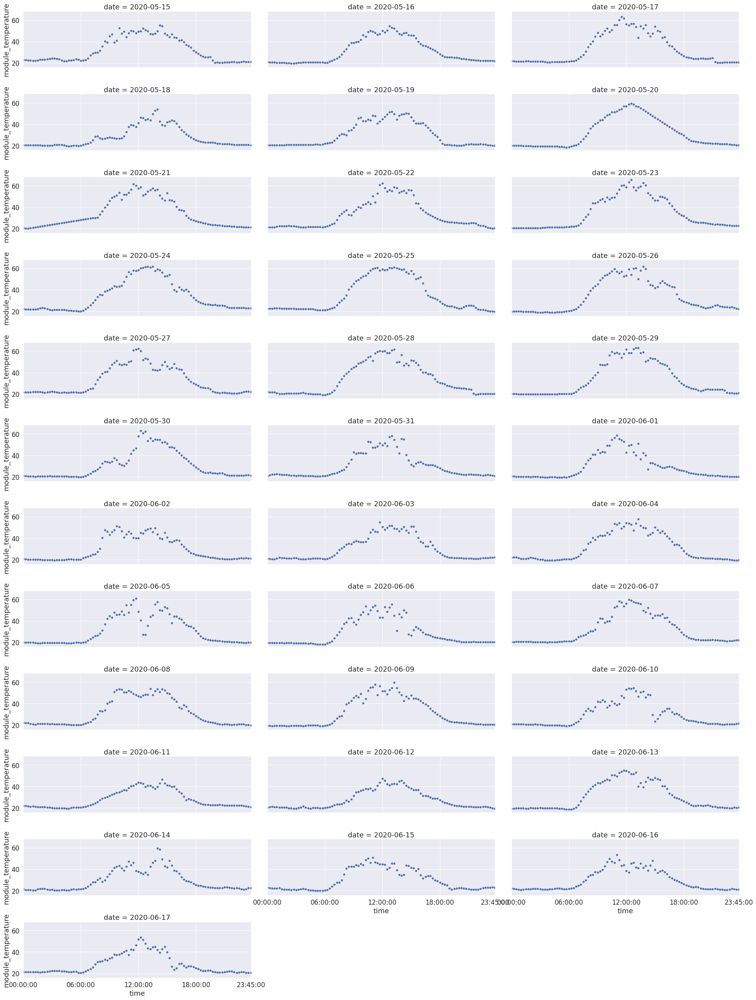

In [67]:
data = sensor01
data['time'] = data['time'].astype(str)
sns.set(font_scale =1.5)
g = sns.relplot(data=data,
            x='time',
            y='module_temperature',
            col='date',
            kind='scatter',
            height=3,
            aspect=3,
            col_wrap=3)
g.set(xlim=('00:00:00', '23:45:00'), xticks=['00:00:00','06:00:00','12:00:00','18:00:00','23:45:00'])

In [68]:
solar01_with_sensor01_inv= [0]*22
solar02_with_sensor02_inv= [0]*22

for i in range(22):
    solar01_with_sensor01_inv[i] = pd.concat([solar01_inv[i],sensor01.drop(['date','time'], axis=1)], axis=1)
    

for i in range(22):
    solar02_with_sensor02_inv[i] = pd.concat([solar02_inv[i],sensor02.drop(['date','time'], axis=1)], axis=1)

In [69]:
solar01_with_sensor01 = pd.concat(solar01_with_sensor01_inv)
solar02_with_sensor02 = pd.concat(solar02_with_sensor02_inv)

In [70]:
solar01_with_sensor01.head()

,source_key,dc_power,ac_power,daily_yield,total_yield,date,time,date_time,source_key,ambient_temperature,module_temperature,irradiation
date_time,,,,,,,,,,,,
2020-05-15 00:00:00,0,0.0,0.0,0.0,6259559.0,2020-05-15,00:00:00,2020-05-15 00:00:00,HmiyD2TTLFNqkNe,25.184316,22.857507,0.0
2020-05-15 00:15:00,0,0.0,0.0,0.0,6259559.0,2020-05-15,00:15:00,2020-05-15 00:15:00,HmiyD2TTLFNqkNe,25.084589,22.761668,0.0
2020-05-15 00:30:00,0,0.0,0.0,0.0,6259559.0,2020-05-15,00:30:00,2020-05-15 00:30:00,HmiyD2TTLFNqkNe,24.935753,22.592306,0.0
2020-05-15 00:45:00,0,0.0,0.0,0.0,6259559.0,2020-05-15,00:45:00,2020-05-15 00:45:00,HmiyD2TTLFNqkNe,24.846130,22.360852,0.0
2020-05-15 01:00:00,0,0.0,0.0,0.0,6259559.0,2020-05-15,01:00:00,2020-05-15 01:00:00,HmiyD2TTLFNqkNe,24.621525,22.165423,0.0


In [71]:
solar02_with_sensor02.head()

,source_key,dc_power,ac_power,daily_yield,total_yield,date,time,date_time,source_key,ambient_temperature,module_temperature,irradiation
date_time,,,,,,,,,,,,
2020-05-15 00:00:00,0,0.0,0.0,9425.0,2429011.0,2020-05-15,00:00:00,2020-05-15 00:00:00,iq8k7ZNt4Mwm3w0,27.004764,25.060789,0.0
2020-05-15 00:15:00,0,0.0,0.0,9425.0,2429011.0,2020-05-15,00:15:00,2020-05-15 00:15:00,iq8k7ZNt4Mwm3w0,26.880811,24.421869,0.0
2020-05-15 00:30:00,0,0.0,0.0,9425.0,2429011.0,2020-05-15,00:30:00,2020-05-15 00:30:00,iq8k7ZNt4Mwm3w0,26.682055,24.427290,0.0
2020-05-15 00:45:00,0,0.0,0.0,9425.0,2429011.0,2020-05-15,00:45:00,2020-05-15 00:45:00,iq8k7ZNt4Mwm3w0,26.500589,24.420678,0.0
2020-05-15 01:00:00,0,0.0,0.0,7540.0,2429011.0,2020-05-15,01:00:00,2020-05-15 01:00:00,iq8k7ZNt4Mwm3w0,26.596148,25.088210,0.0


In [72]:
solar01_with_sensor01['plant_ID'] = '1'
solar02_with_sensor02['plant_ID'] = '2'

In [73]:
full_data = pd.concat([solar01_with_sensor01, solar02_with_sensor02], ignore_index=True)

In [74]:
full_data

,source_key,dc_power,ac_power,daily_yield,total_yield,date,time,date_time,source_key,ambient_temperature,module_temperature,irradiation,plant_ID
0,0,0.0,0.0,0.0,6259559.0,2020-05-15,00:00:00,2020-05-15 00:00:00,HmiyD2TTLFNqkNe,25.184316,22.857507,0.0,1
1,0,0.0,0.0,0.0,6259559.0,2020-05-15,00:15:00,2020-05-15 00:15:00,HmiyD2TTLFNqkNe,25.084589,22.761668,0.0,1
2,0,0.0,0.0,0.0,6259559.0,2020-05-15,00:30:00,2020-05-15 00:30:00,HmiyD2TTLFNqkNe,24.935753,22.592306,0.0,1
3,0,0.0,0.0,0.0,6259559.0,2020-05-15,00:45:00,2020-05-15 00:45:00,HmiyD2TTLFNqkNe,24.846130,22.360852,0.0,1
4,0,0.0,0.0,0.0,6259559.0,2020-05-15,01:00:00,2020-05-15 01:00:00,HmiyD2TTLFNqkNe,24.621525,22.165423,0.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
143611,21,0.0,0.0,4316.0,209335741.0,2020-06-17,22:45:00,2020-06-17 22:45:00,iq8k7ZNt4Mwm3w0,23.511703,22.856201,0.0,2
143612,21,0.0,0.0,4316.0,209335741.0,2020-06-17,23:00:00,2020-06-17 23:00:00,iq8k7ZNt4Mwm3w0,23.482282,22.744190,0.0,2
143613,21,0.0,0.0,4316.0,209335741.0,2020-06-17,23:15:00,2020-06-17 23:15:00,iq8k7ZNt4Mwm3w0,23.354743,22.492245,0.0,2
143614,21,0.0,0.0,4316.0,209335741.0,2020-06-17,23:30:00,2020-06-17 23:30:00,iq8k7ZNt4Mwm3w0,23.291048,22.373909,0.0,2


In [75]:
data1=solar01.groupby(['source_key']).sum().reset_index()
data1['source_key'] = data1['source_key'].apply(lambda x: solar01_inverter_id[x])
data2=solar02.groupby(['source_key']).sum().reset_index()
data2['source_key'] = data2['source_key'].apply(lambda x: solar02_inverter_id[x])

specs = [[{'type':'domain'}, {'type':'domain'}]]
fig = make_subplots(rows=1, cols=2, specs=specs)

pull_factor = [0]*22
pull_factor[7] = 0.05

fig.add_trace(go.Pie(labels='P1 '+ data1['source_key'], 
                     values=data1['dc_power'], 
                     name='Plant 1', 
                     title='Plant 1',
                     titlefont=dict(
                                     size=25
                                   ),
                     hovertemplate="%{label} <br />generates %{value:,.0f} kW",
                     marker_colors = px.colors.qualitative.Dark24,
                     legendgroup = 'Plant 1',
                    ), 1, 1)

fig.add_trace(go.Pie(labels='P2 '+ data2['source_key'], 
                     values=data2['dc_power'], 
                     name='Plant 2', 
                     title='Plant 2',
                     titlefont=dict(
                                     size=25
                                   ),
                     hovertemplate="%{label} <br />generates %{value:,.0f} kW",
                     marker_colors = px.colors.qualitative.Light24,   
                     legendgroup = 'Plant 2',
                     pull =pull_factor,
                    ), 1, 2)

fig.update_traces(hole=.4)

fig.update_layout(
    title_text="DC Power Generation of each Inverter"
)

fig.show()

In [78]:
data1=solar01.groupby(['source_key']).sum().reset_index()
data1['source_key'] = data1['source_key'].apply(lambda x: solar01_inverter_id[x])
data2=solar02.groupby(['source_key']).sum().reset_index()
data2['source_key'] = data2['source_key'].apply(lambda x: solar02_inverter_id[x])

specs = [[{'type':'domain'}, {'type':'domain'}]]
fig = make_subplots(rows=1, cols=2, specs=specs)

pull_factor = [0]*22
pull_factor[7] = 0.05

fig.add_trace(go.Pie(labels='P1 '+ data1['source_key'], 
                     values=data1['ac_power'], 
                     name='Plant 1', 
                     title='Plant 1',
                     titlefont=dict(
                                     size=25
                                   ),
                     hovertemplate="%{label} <br />generates %{value:,.0f} kW",
                     marker_colors = px.colors.qualitative.Dark24,
                     legendgroup = 'Plant 1',
                    ), 1, 1)

fig.add_trace(go.Pie(labels='P2 '+ data2['source_key'], 
                     values=data2['ac_power'], 
                     name='Plant 2', 
                     title='Plant 2',
                     titlefont=dict(
                                     size=25
                                   ),
                     hovertemplate="%{label} <br />generates %{value:,.0f} kW",
                     marker_colors = px.colors.qualitative.Light24,   
                     legendgroup = 'Plant 2',
                     pull =pull_factor,
                    ), 1, 2)

fig.update_traces(hole=.4)

fig.update_layout(
    title_text="AC Power Generation of each Inverter"
)


fig.show()

In [81]:
data1=solar01
data2=solar02

fig = go.Figure()

fig.add_trace(go.Scattergl(x=data1['time'], 
                         y=data1['dc_power'],
                         mode='markers',
                         marker=dict(
                             size=4,
                             color= data1['dc_power'],
                             cauto=True,
                             colorscale ='Oryel',
                             opacity=0.3
                         ),
                         name='Plant 1 DC power'))

fig.add_trace(go.Scatter(x=data1['time'], 
                         y=data1.groupby('time').mean()['dc_power'],
                         mode='lines',
                             line=dict(
                             color='DarkGray',
                             width=3
                         ),
                         name='Plant 1 Mean'))

fig.add_trace(go.Scattergl(x=data2['time'], 
                         y=data2['dc_power'],
                         mode='markers',
                         marker=dict(
                             size=4,
                             color= data2['dc_power'],
                             cauto=True,
                             colorscale ='Blugrn',
                             opacity=0.3
                         ),
                         name='Plant 2 DC power'))

fig.add_trace(go.Scatter(x=data2['time'], 
                         y=data2.groupby('time').mean()['dc_power'],
                         mode='lines',
                             line=dict(
                             color='DarkOliveGreen',
                             width=3
                         ),
                         name='Plant 2 Mean'))

fig.update_layout(title= 'DC Power Generation by time',
                  height = 600)
fig.show()

In [82]:
data1=solar01
data2=solar02

fig = go.Figure()

fig.add_trace(go.Scattergl(x=data1['time'], 
                         y=data1['ac_power'],
                         mode='markers',
                         marker=dict(
                             size=4,
                             color= data1['ac_power'],
                             cauto=True,
                             colorscale ='Oryel',
                             opacity=0.3
                         ),
                         name='Plant 1 AC power'))

fig.add_trace(go.Scatter(x=data1['time'], 
                         y=data1.groupby('time').mean()['ac_power'],
                         mode='lines',
                             line=dict(
                             color='DarkGray',
                             width=3
                         ),
                         name='Plant 1 Mean'))

fig.add_trace(go.Scattergl(x=data2['time'], 
                         y=data2['ac_power'],
                         mode='markers',
                         marker=dict(
                             size=4,
                             color= data2['ac_power'],
                             cauto=True,
                             colorscale ='Blugrn',
                             opacity=0.3
                         ),
                         name='Plant 2 AC power'))

fig.add_trace(go.Scatter(x=data2['time'], 
                         y=data2.groupby('time').mean()['ac_power'],
                         mode='lines',
                             line=dict(
                             color='DarkOliveGreen',
                             width=3
                         ),
                         name='Plant 2 Mean'))

fig.update_layout(title= 'AC Power Generation by time',
                  height = 600)
fig.show()

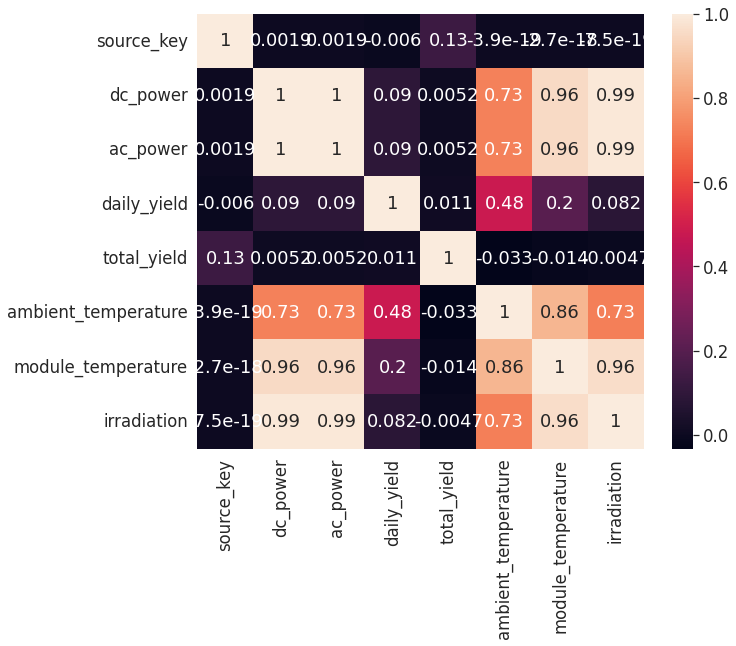

In [83]:
plt.figure(figsize=(10,8))
sns.heatmap(solar01_with_sensor01.corr(), annot=True)

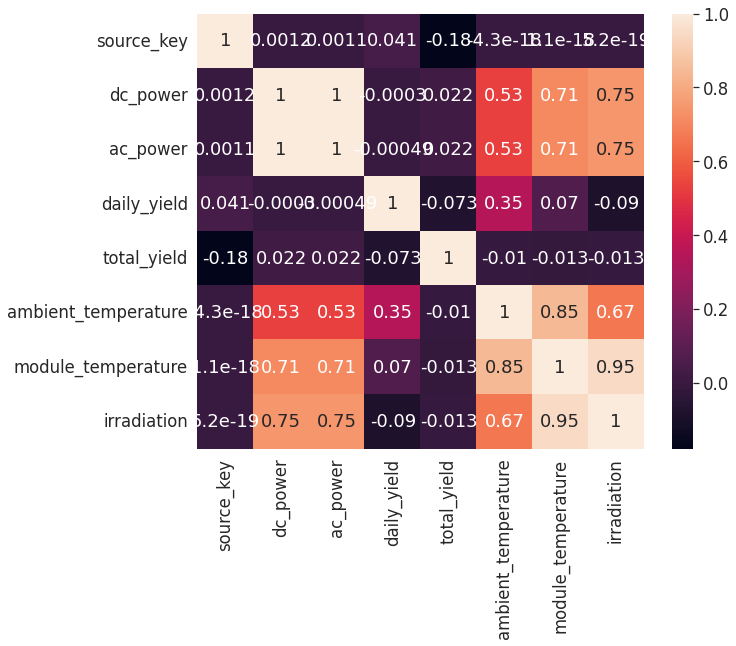

In [84]:
plt.figure(figsize=(10,8))
sns.heatmap(solar02_with_sensor02.corr(), annot=True)

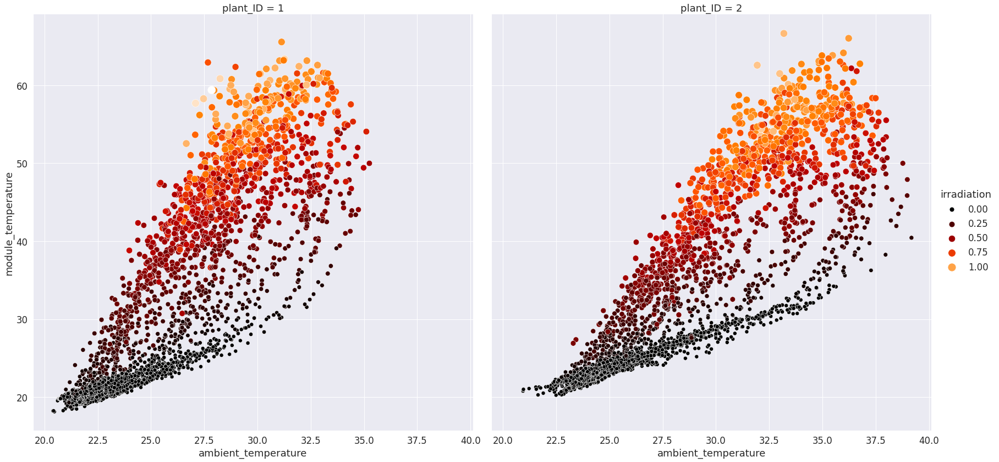

In [85]:
data = full_data.groupby(['plant_ID','date','time']).mean().reset_index()
data = data.drop(['date','time'], axis=1)
sns.relplot(data=data, 
            x="ambient_temperature", 
            y="module_temperature", 
            hue='irradiation',
            size='irradiation',
            sizes=(50,200),
            palette='gist_heat',
            height=12,
            col='plant_ID'
           )


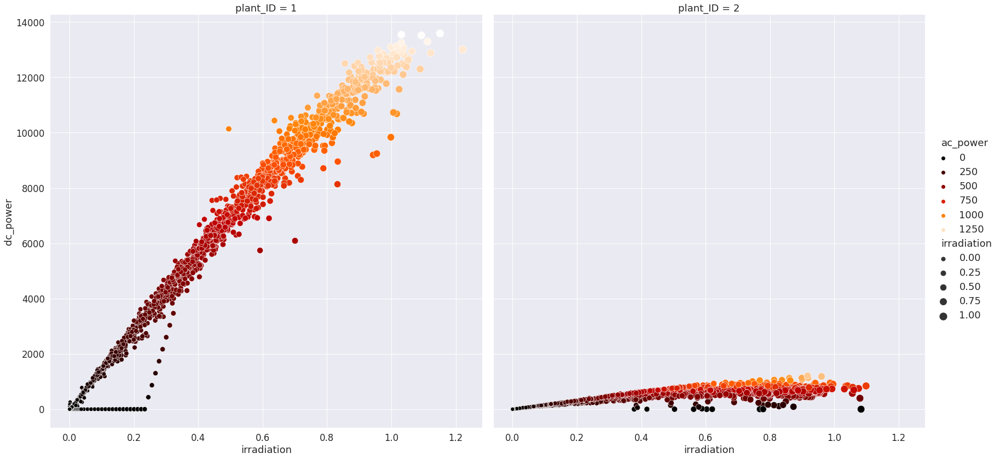

In [86]:
data = full_data.groupby(['plant_ID','date','time']).mean().reset_index()
data = data.drop(['date','time'], axis=1)
sns.relplot(data=data, 
            x="irradiation", 
            y="dc_power", 
            hue='ac_power',
            size='irradiation',
            sizes=(50,200),
            palette='gist_heat',
            height=12,
            col='plant_ID'
           )